In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from typing import Optional
import plotly.express as px
import plotly.graph_objects as go
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.preprocessing import StandardScaler

In [22]:
# Get data into dataframe
df = pd.read_csv('../WMA_fractions_v2.csv', skiprows=1)

# Preprocess data to only have temperature, salinity and dissolved oxygen
df_TSO = df.copy()
df_TSO = df_TSO[['Conservative_Temperature_[deg_C]', 'Absolute_Salinity_[PSU]', 'Dissolved_Oxygen_[micro_mol_per_kg]','Depth_[m]', 'Latitude_[deg_N]', 'Longitude_[deg_E]']]
df_TSO = df_TSO.dropna()

In [23]:
def uniform_geographic_sample(
    df: pd.DataFrame,
    n_samples: int,
    lat_col: str = 'latitude',
    lon_col: str = 'longitude',
    n_grid_cells: int = 50,
    random_state: Optional[int] = None) -> pd.DataFrame:
    """
    Sample points from a dataset to minimize spatial density variability.
    
    Uses grid-based stratified sampling to ensure uniform geographic coverage.
    
    Parameters:
    -----------
    df : pd.DataFrame
        Input dataframe with geographic coordinates
    n_samples : int
        Number of samples to draw
    lat_col : str
        Name of the latitude column
    lon_col : str
        Name of the longitude column
    n_grid_cells : int
        Number of grid cells per dimension (creates n_grid_cells x n_grid_cells grid)
    random_state : int, optional
        Random seed for reproducibility
        
    Returns:
    --------
    pd.DataFrame
        Sampled dataframe with uniform spatial distribution
    """
    if random_state is not None:
        np.random.seed(random_state)
    
    df = df.copy()
    
    # Get coordinate bounds
    lat_min, lat_max = df[lat_col].min(), df[lat_col].max()
    lon_min, lon_max = df[lon_col].min(), df[lon_col].max()
    
    # Create grid cells
    lat_bins = np.linspace(lat_min, lat_max, n_grid_cells + 1)
    lon_bins = np.linspace(lon_min, lon_max, n_grid_cells + 1)
    
    # Assign each point to a grid cell
    df['_lat_bin'] = pd.cut(df[lat_col], bins=lat_bins, labels=False, include_lowest=True)
    df['_lon_bin'] = pd.cut(df[lon_col], bins=lon_bins, labels=False, include_lowest=True)
    df['_grid_cell'] = df['_lat_bin'].astype(str) + '_' + df['_lon_bin'].astype(str)
    
    # Count points per grid cell
    cell_counts = df['_grid_cell'].value_counts()
    occupied_cells = len(cell_counts)
    
    # Calculate target samples per cell for uniform distribution
    samples_per_cell = n_samples / occupied_cells
    
    # Strategy: Sample equally from each occupied cell for uniform coverage
    # First pass: try to take equal samples from each cell
    base_samples_per_cell = n_samples // occupied_cells
    extra_samples = n_samples % occupied_cells
    
    sampled_dfs = []
    cells_to_boost = []
    
    for i, cell_id in enumerate(cell_counts.index):
        cell_df = df[df['_grid_cell'] == cell_id]
        
        # Base samples for this cell
        n_from_cell = base_samples_per_cell
        
        # Distribute extra samples to first few cells
        if i < extra_samples:
            n_from_cell += 1
        
        # Can't sample more than available in cell
        n_from_cell = min(n_from_cell, len(cell_df))
        
        if n_from_cell > 0:
            sampled = cell_df.sample(n=n_from_cell, replace=False)
            sampled_dfs.append(sampled)
        
        # Track if this cell couldn't provide enough samples
        if n_from_cell < base_samples_per_cell + (1 if i < extra_samples else 0):
            deficit = (base_samples_per_cell + (1 if i < extra_samples else 0)) - n_from_cell
            cells_to_boost.append(deficit)
    
    # Combine all samples
    result = pd.concat(sampled_dfs, ignore_index=True)
    
    # If we have a deficit, sample more from cells that have remaining points
    if len(result) < n_samples:
        remaining_df = df[~df.index.isin(result.index)]
        if len(remaining_df) > 0:
            additional_needed = n_samples - len(result)
            additional = remaining_df.sample(n=min(additional_needed, len(remaining_df)), replace=False)
            result = pd.concat([result, additional], ignore_index=True)
    
    # Remove helper columns
    result = result.drop(columns=['_lat_bin', '_lon_bin', '_grid_cell'])
    
    return result

In [24]:
df_sampled = uniform_geographic_sample(df_TSO, n_samples=100000, lat_col='Latitude_[deg_N]', lon_col='Longitude_[deg_E]', n_grid_cells=100, random_state=22)

In [25]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_sampled)

In [26]:
input_dim = X_scaled.shape[1]
latent_dim = 2

# Encoder
inputs = layers.Input(shape=(input_dim,))
x = layers.Dense(16, activation='relu')(inputs)
x = layers.Dense(8, activation='relu')(x)
latent = layers.Dense(latent_dim, name="latent")(x)

# Decoder
x = layers.Dense(8, activation='relu')(latent)
x = layers.Dense(16, activation='relu')(x)
outputs = layers.Dense(input_dim)(x)

autoencoder = models.Model(inputs, outputs)
encoder = models.Model(inputs, latent)

In [27]:
autoencoder.compile(
    optimizer='adam',
    loss='mse')

autoencoder.fit(
    X_scaled,
    X_scaled,
    epochs=50,
    batch_size=64,
    validation_split=0.1,
    verbose=0)

3125/3125 ━━━━━━━━━━━━━━━━━━━━ 2s 741us/step


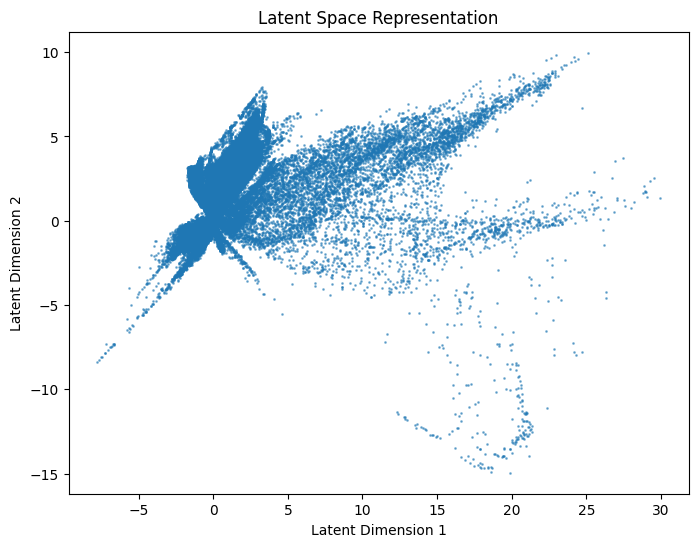

In [28]:
X_latent = encoder.predict(X_scaled)

plt.figure(figsize=(8,6))
plt.scatter(X_latent[:,0], X_latent[:,1], s=1, alpha=0.5)
plt.title('Latent Space Representation')
plt.xlabel('Latent Dimension 1')
plt.ylabel('Latent Dimension 2')
plt.show()

In [29]:
from sklearn.mixture import GaussianMixture 
# Do BIC and AIC calculation for different number of clusters
bic_scores = []
aic_scores = []
n_components_range = range(1, 12)
for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=22)
    gmm.fit(X_latent)
    bic_scores.append(gmm.bic(X_latent))
    aic_scores.append(gmm.aic(X_latent))

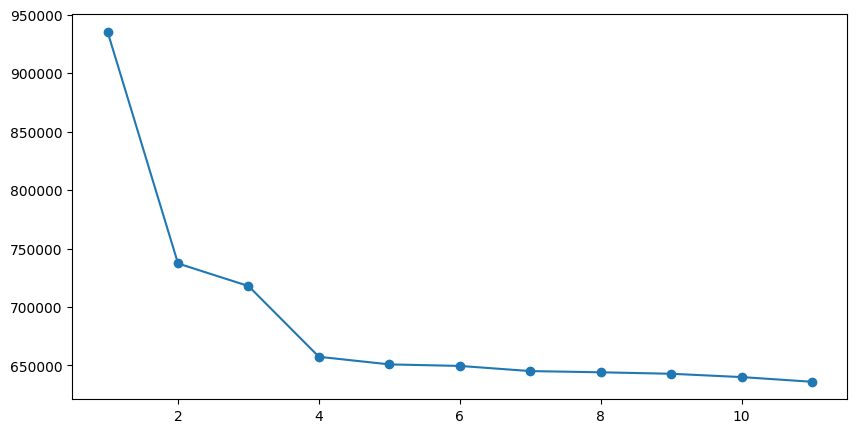

In [30]:
plt.figure(figsize=(10,5))
plt.plot(n_components_range, bic_scores, label='BIC', marker='o')

In [31]:
gmm = GaussianMixture(
    n_components=4,          # number of clusters
    covariance_type='full',  # usually best in PCA space
    random_state=22)

labels = gmm.fit_predict(X_latent)

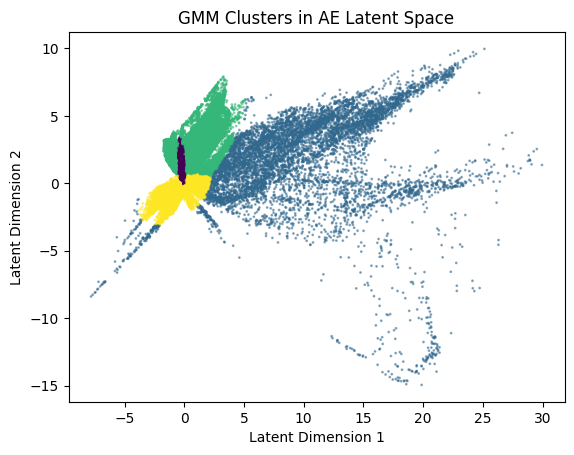

In [32]:
plt.scatter(X_latent[:, 0], X_latent[:, 1], c=labels, s=1, alpha=0.5)
plt.xlabel("Latent Dimension 1")
plt.ylabel("Latent Dimension 2")
plt.title("GMM Clusters in AE Latent Space")
plt.show()

In [33]:
df_sampled['gmm_label']=labels

In [34]:
import plotly.express as px
# Compute data centroid (mean location)
center_lat = df_sampled['Latitude_[deg_N]'].mean()
center_lon = df_sampled['Longitude_[deg_E]'].mean()

print("Center lat:", center_lat, "Center lon:", center_lon)

# Use labels from kmeans clustering on data to plot geographically
fig3 = px.scatter_geo(
    df_sampled,
    lat='Latitude_[deg_N]',
    lon='Longitude_[deg_E]',
    color='gmm_label',
    title="Gaussian Mixture Model on VAE latent space projected on geographic map"
)

fig3.update_geos(
    projection_type="orthographic",
    projection_rotation=dict(lat=center_lat, lon=center_lon),
    showcoastlines=True,
    showcountries=True
)

fig3.update_layout(height=800, width=800)
fig3.show()

Center lat: 79.81604592 Center lon: -50.949791180000005


In [35]:
import plotly.graph_objects as go
# Plot in depth at different latitudes
fig4 = go.Figure()
for label in df_sampled['gmm_label'].unique():
    df_subset = df_sampled[df_sampled['gmm_label'] == label]
    fig4.add_trace(go.Scatter3d(
        x=df_subset['Longitude_[deg_E]'],
        y=df_subset['Latitude_[deg_N]'],
        z=df_subset['Depth_[m]'],
        mode='markers',
        marker=dict(size=2),
        name=f'Cluster {label}'
    ))
fig4.update_layout(
    scene=dict(
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Depth (m)',
        zaxis=dict(autorange='reversed')  # Depth increases downwards
    ),
    title="3D Scatter plot of GMM clusters in geographic space"
)
fig4.show()

In [36]:
probs = gmm.predict_proba(X_latent)

In [37]:
labels = probs.argmax(axis=1)

In [38]:
df_sampled["gmm_prob"] = probs.max(axis=1)

In [39]:
fig = px.scatter_geo(
    df_sampled,
    lat='Latitude_[deg_N]',
    lon='Longitude_[deg_E]',
    color='gmm_prob',
    color_continuous_scale='Viridis',
    title="GMM membership probability (soft clustering)",
)

fig.update_geos(
    projection_type="orthographic",
    projection_rotation=dict(lat=center_lat, lon=center_lon),
    showcoastlines=True,
    showcountries=True
)

fig.update_layout(height=800, width=800)
fig.show()

In [40]:
import plotly.graph_objects as go
import numpy as np

fig = go.Figure()

for label in np.unique(labels):
    idx = labels == label
    prob = probs[idx, label]  # probability for this cluster
    df_subset = df_sampled[idx]

    fig.add_trace(go.Scatter3d(
        x=df_subset['Longitude_[deg_E]'],
        y=df_subset['Latitude_[deg_N]'],
        z=df_subset['Depth_[m]'],
        mode='markers',
        marker=dict(
            size=3,
            color=prob,          # probability maps to color
            colorscale='Viridis',
            colorbar=dict(title='Membership Probability'),
            opacity=0.8
        ),
        name=f'Cluster {label}'
    ))

fig.update_layout(
    scene=dict(
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Depth (m)',
        zaxis=dict(autorange='reversed')
    ),
    title="3D Scatter plot of GMM clusters (probabilistic)"
)
fig.show()
